In [1]:
import torch
import torch.nn as nn

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

from tqdm.autonotebook import tqdm
from time import sleep

In [2]:
device = torch.device('cuda:0')

In [3]:
SEED = 42
np.random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)

In [4]:
!wget http://sereja.me/f/universum_compressed.tar
!tar xf universum_compressed.tar

--2022-03-20 19:36:06--  http://sereja.me/f/universum_compressed.tar
Resolving sereja.me (sereja.me)... 213.159.215.132
Connecting to sereja.me (sereja.me)|213.159.215.132|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 72028160 (69M) [application/x-tar]
Saving to: ‘universum_compressed.tar’

universum_compresse 100%[===================>]  68.69M  5.64MB/s    in 14s     

2022-03-20 19:36:20 (4.83 MB/s) - ‘universum_compressed.tar’ saved [72028160/72028160]



In [5]:
import os
from PIL import Image

class ColorizationDataset(Dataset):
    def __init__(self, path, transform_x, transform_y):
        self.transform_x = transform_x
        self.transform_y = transform_y
      
        filenames = []
        for root, dirs, files in os.walk(path):
            for file in files:
                if file.endswith('.jpg') or file.endswith('.JPG'):
                    filenames.append(os.path.join(root, file))

        self.images = []
        for filename in tqdm(filenames):
            try:
                with Image.open(filename) as image:
                    self.images.append(image.copy())
            except:
                pass
                #print('Could not load image:', filename)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = self.images[idx]
        Y = self.transform_y(img)
        X = self.transform_x(Y)
        return X, Y

In [6]:
transform_all = transforms.Compose([
    transforms.RandomResizedCrop(128),
    # горизонтально перевернем -- изображение останется валидным
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
])

def to_grayscale(x):
    return 1 - (x[0] * 0.299 + x[1] * 0.587 + x[2] * 0.114).view(1, 128, 128)

In [7]:
dataset = ColorizationDataset('universum-photos', to_grayscale, transform_all)
loader = DataLoader(dataset, batch_size=64, shuffle=True)

  0%|          | 0/1254 [00:00<?, ?it/s]

In [8]:
len(dataset)

1015

In [9]:
def Block(channels_in, channels_out):
    return nn.Sequential(
        nn.Conv2d(channels_in, channels_out, (3, 3), padding=1),
        nn.ReLU()
    )

class Colorizer(nn.Module):
    def __init__(self):
        super().__init__()

        self.preconcat = nn.Sequential(
            # В коментарии записано то, что идет на вход обработчику
            Block(1, 64),                               # 1, 128, 128
            nn.MaxPool2d((2, 2), stride=(2, 2)),        # 64, 128, 128
            Block(64, 128),                             # 64, 64, 64
            nn.MaxPool2d((2, 2), stride=(2, 2)),        # 128, 64, 64
            Block(128, 256),                            # 128, 32, 32
            Block(256, 512),                            # 256, 32, 32
            Block(512, 512),                            # 512, 32, 32
            Block(512, 512),                            # 512, 32, 32
            Block(512, 512),                            # 512, 32, 32
            nn.Upsample(scale_factor=2),                # 512, 32, 32
            Block(512, 256),                            # 512, 64, 64
            Block(256, 128),                            # 256, 64, 64
            nn.Upsample(scale_factor=2),                # 128, 64, 64
            Block(128, 64),                             # 128, 128, 128
        )

        # Текущая размерность: 64, 128, 128 - 64 канала
        # Теперь добавим (сконкатенируем) исходную картинку: -> 65, 128, 128
        
        # Несколько слоев, размазывающих цвета по картинке
        self.postconcat = nn.Sequential(
            nn.Conv2d(65, 32, (3, 3), padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 3, (3, 3), padding=1),
            nn.Sigmoid() # - для того, чтобы каждый пиксель стал от 0 до 1
        )
    
    def forward(self, x):
        h = self.preconcat(x)
        # исходное ч/б изображение склеим просто дополнительным слоем
        h = torch.cat((h, x), 1)
        h = self.postconcat(h)
        return h

In [10]:
def to_numpy_image(img):
    # tl;dr: PyTorch хочет (3, 128, 128), а plt.imshow хочет (128, 128, 3)
    # есть два популярных формата для цветных картинок:
    #  1. где размерность, соответствующая каналам, идёт последней
    #  2. где размерность, соответствующая каналам, идёт первой
    # при работе с нейросетями удобен первый подход -- так запрашиваемая
    # при вычислениях память идёт последовательно, и из-за кэширования
    # операции свёртки работают быстрее
    # второй подход удобнее при уже работе с устройством, которое эти картинки показывает
    # -- удобно на три лампочки послать сразу три последовательно идущих байта
    return img.detach().cpu().view(3, 128, 128).transpose(0, 1).transpose(1, 2).numpy()

In [11]:
def draw(model, num, t=1, ind=False):
    for t in range(num, num+t):
        if ind:
            print(t)
        img_gray, img_true = dataset[t]
        img_pred = model(img_gray.to(device).view(1, 1, 128, 128))
        img_pred = to_numpy_image(img_pred)
        # теперь это numpy-евский ndarray размера (128, 128, 3)
        plt.figure(figsize=(10,10))

        plt.subplot(141)
        plt.axis('off')
        plt.set_cmap('Greys')
        plt.title("Gray image")
        plt.imshow(img_gray.reshape((128, 128)))

        plt.subplot(142)
        plt.axis('off')
        plt.title("Colorized image")
        plt.imshow(img_pred.reshape((128, 128, 3)))

        plt.subplot(143)
        plt.axis('off')
        plt.title("0riginal image")
        plt.imshow(to_numpy_image(img_true))

        plt.show()


def draw_special(model, bank):
    for t in bank:
        img_gray, img_true = dataset[t]
        img_pred = model(img_gray.to(device).view(1, 1, 128, 128))
        img_pred = to_numpy_image(img_pred)
        plt.figure(figsize=(10,10))

        plt.subplot(141)
        plt.axis('off')
        plt.set_cmap('Greys')
        plt.title("Gray image")
        plt.imshow(img_gray.reshape((128, 128)))

        plt.subplot(142)
        plt.axis('off')
        plt.title("Colorized image")
        plt.imshow(img_pred.reshape((128, 128, 3)))

        plt.subplot(143)
        plt.axis('off')
        plt.title("0riginal image")
        plt.imshow(to_numpy_image(img_true))

        plt.show()

In [12]:
from google.colab import drive
import os

drive.mount("/content/gdrive/")

Mounted at /content/gdrive/


In [13]:
def train(model, criterion, optimizer, PATH, fname='temp_tensor.pt', fname_best='temp_tensor_best.pt', pic=54, num_epochs=100):

    checkpoint = torch.load(PATH+fname) if os.path.exists(PATH+fname) else 0
    best_checkpoint = torch.load(PATH+fname_best) if os.path.exists(PATH+fname_best) else 0

    if checkpoint:
        start_epoch = checkpoint['last_epoch'] + 1
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        history = checkpoint['history']
        history_epochs_loss = checkpoint['history_epochs_loss']

        best_loss = best_checkpoint['loss'] if best_checkpoint else 1

        for e, l in enumerate(history_epochs_loss):
            print(f"Epoch = {e}, loss = {l}, best_loss = {best_loss}")
        print(f"\nContinue training from {start_epoch} epoch")
    else:
        start_epoch = 0
        best_loss = 1
        history, history_epochs_loss = [], []

    FLAG = 0

    for epoch in tqdm(range(start_epoch, num_epochs)):
        for x, y in tqdm(loader, leave=False):
            
            # 0. распакавать данные на нужное устройство
            x = x.to(device)
            y = y.to(device)
            # 1. сбросить градиент
            optimizer.zero_grad()
            # 2. прогнать данные через сеть
            colorized = model(x)
            # 3. посчитать loss
            loss = criterion(y, colorized)
            # 4. залоггировать его куда-нибудь
            history.append(loss.item())
            # 5. сделать .backward()
            loss.backward()
            # 6. optimizer.step()
            optimizer.step()
            # (7. вывести пример колоризации -- см код ниже)    

        history_epochs_loss.append(history[-1])

        if best_loss > history[-1]:
            best_loss = history[-1]
            FLAG = 1
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'loss': best_loss,
            }, PATH+fname_best)
        else:
            FLAG = 0

        torch.save({
            'last_epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'history_epochs_loss': history_epochs_loss,
            'history': history,
        }, PATH+fname)

        print(f"Epoch = {epoch}, loss = {history[-1]}" + (" - best loss for now" if FLAG else ""))
        if not epoch % 10:
          draw(model, pic) #np.random.randint(0, len(dataset)))

    torch.cuda.empty_cache() # после обработки последней эпохи сборщик мусора почему-то не чистит видеопамять, поэтому почищу вручную

    return model, history

In [14]:
lr = 1e-3

model1 = Colorizer().to(device)
optimizer = torch.optim.Adam(model1.parameters(), lr=lr)
criterion = nn.L1Loss()

In [15]:
# PATH = '/content/gdrive/MyDrive/Colab Notebooks/Tinkoff DL/Занятие 2/'
PATH = '/content/gdrive/MyDrive/'

  0%|          | 0/101 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 0, loss = 0.174138605594635 - best loss for now


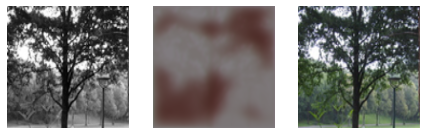

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 1, loss = 0.1288667619228363 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 2, loss = 0.1082327589392662 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 3, loss = 0.0861620157957077 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 4, loss = 0.09205778688192368


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 5, loss = 0.07351218909025192 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 6, loss = 0.0697198137640953 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 7, loss = 0.07495362311601639


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 8, loss = 0.07120929658412933


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 9, loss = 0.06198785826563835 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 10, loss = 0.07196491211652756


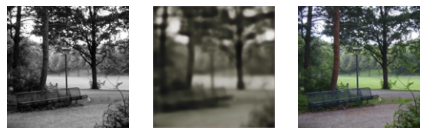

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 11, loss = 0.06533442437648773


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 12, loss = 0.06199096143245697


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 13, loss = 0.05760761350393295 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 14, loss = 0.06545662879943848


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 15, loss = 0.06331653147935867


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 16, loss = 0.060604069381952286


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 17, loss = 0.055145636200904846 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 18, loss = 0.05714156851172447


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 19, loss = 0.05295290797948837 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 20, loss = 0.05815338343381882


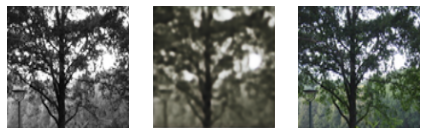

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 21, loss = 0.05464116856455803


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 22, loss = 0.06274796277284622


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 23, loss = 0.058744821697473526


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 24, loss = 0.06159831956028938


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 25, loss = 0.05689079314470291


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 26, loss = 0.05379081144928932


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 27, loss = 0.0551859512925148


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 28, loss = 0.0609002523124218


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 29, loss = 0.05908792465925217


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 30, loss = 0.05231136828660965 - best loss for now


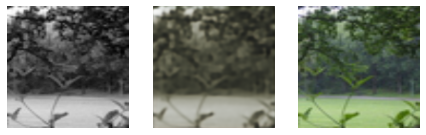

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 31, loss = 0.05254702642560005


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 32, loss = 0.051338136196136475 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 33, loss = 0.0563422255218029


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 34, loss = 0.05777592957019806


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 35, loss = 0.05685162916779518


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 36, loss = 0.05632510036230087


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 37, loss = 0.04931957274675369 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 38, loss = 0.057418860495090485


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 39, loss = 0.055688150227069855


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 40, loss = 0.048337072134017944 - best loss for now


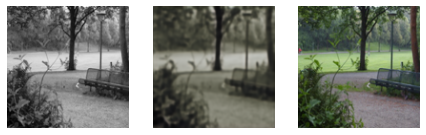

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 41, loss = 0.057111188769340515


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 42, loss = 0.05320889130234718


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 43, loss = 0.05391634628176689


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 44, loss = 0.04966508597135544


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 45, loss = 0.054054178297519684


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 46, loss = 0.054700758308172226


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 47, loss = 0.053022753447294235


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 48, loss = 0.051281195133924484


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 49, loss = 0.05572756379842758


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 50, loss = 0.04894222319126129


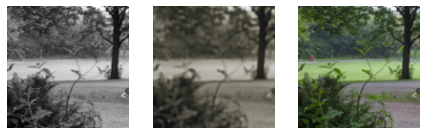

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 51, loss = 0.050180092453956604


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 52, loss = 0.05302070826292038


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 53, loss = 0.05564599111676216


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 54, loss = 0.04955952987074852


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 55, loss = 0.04932956025004387


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 56, loss = 0.052366215735673904


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 57, loss = 0.048284731805324554 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 58, loss = 0.053659431636333466


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 59, loss = 0.057411856949329376


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 60, loss = 0.04707406461238861 - best loss for now


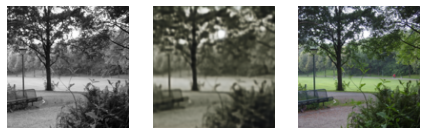

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 61, loss = 0.052238721400499344


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 62, loss = 0.05598181486129761


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 63, loss = 0.05493273586034775


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 64, loss = 0.050222545862197876


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 65, loss = 0.05046139657497406


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 66, loss = 0.047323230654001236


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 67, loss = 0.053067397326231


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 68, loss = 0.05138395354151726


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 69, loss = 0.04626798629760742 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 70, loss = 0.0511280857026577


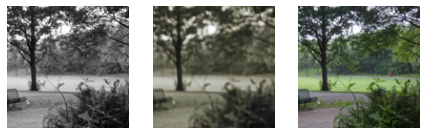

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 71, loss = 0.04684105142951012


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 72, loss = 0.04948411136865616


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 73, loss = 0.04828204959630966


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 74, loss = 0.05358921363949776


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 75, loss = 0.05415896698832512


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 76, loss = 0.05251522362232208


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 77, loss = 0.05133625864982605


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 78, loss = 0.05823100358247757


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 79, loss = 0.055294573307037354


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 80, loss = 0.05197539180517197


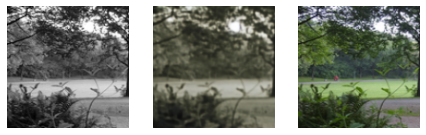

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 81, loss = 0.047091756016016006


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 82, loss = 0.050407782196998596


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 83, loss = 0.04873291775584221


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 84, loss = 0.04843047633767128


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 85, loss = 0.047648075968027115


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 86, loss = 0.0479302816092968


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 87, loss = 0.0509050190448761


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 88, loss = 0.0505698025226593


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 89, loss = 0.04359361529350281 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 90, loss = 0.0473315604031086


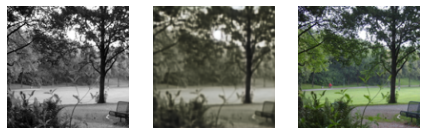

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 91, loss = 0.05010678246617317


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 92, loss = 0.050175972282886505


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 93, loss = 0.05152856558561325


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 94, loss = 0.04986410215497017


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 95, loss = 0.0464000441133976


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 96, loss = 0.04885493591427803


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 97, loss = 0.051379311829805374


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 98, loss = 0.047777995467185974


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 99, loss = 0.048725057393312454


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 100, loss = 0.05385558679699898


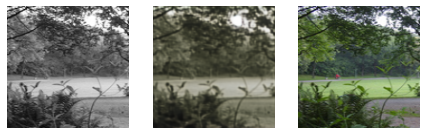

In [ ]:
model1, history = train(model1, criterion, optimizer, PATH, num_epochs=101)

Давайте дообучим модельку.

Epoch = 0, loss = 0.174138605594635, best_loss = 0.04359361529350281
Epoch = 1, loss = 0.1288667619228363, best_loss = 0.04359361529350281
Epoch = 2, loss = 0.1082327589392662, best_loss = 0.04359361529350281
Epoch = 3, loss = 0.0861620157957077, best_loss = 0.04359361529350281
Epoch = 4, loss = 0.09205778688192368, best_loss = 0.04359361529350281
Epoch = 5, loss = 0.07351218909025192, best_loss = 0.04359361529350281
Epoch = 6, loss = 0.0697198137640953, best_loss = 0.04359361529350281
Epoch = 7, loss = 0.07495362311601639, best_loss = 0.04359361529350281
Epoch = 8, loss = 0.07120929658412933, best_loss = 0.04359361529350281
Epoch = 9, loss = 0.06198785826563835, best_loss = 0.04359361529350281
Epoch = 10, loss = 0.07196491211652756, best_loss = 0.04359361529350281
Epoch = 11, loss = 0.06533442437648773, best_loss = 0.04359361529350281
Epoch = 12, loss = 0.06199096143245697, best_loss = 0.04359361529350281
Epoch = 13, loss = 0.05760761350393295, best_loss = 0.04359361529350281
Epoch = 

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 101, loss = 0.04726983234286308


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 102, loss = 0.0505664236843586


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 103, loss = 0.04116961732506752 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 104, loss = 0.04693302884697914


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 105, loss = 0.04058998450636864 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 106, loss = 0.0447082594037056


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 107, loss = 0.04414404556155205


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 108, loss = 0.051671817898750305


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 109, loss = 0.04994721710681915


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 110, loss = 0.0529693067073822


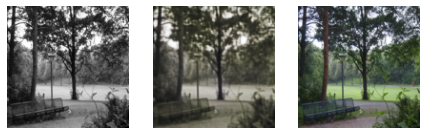

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 111, loss = 0.04687315225601196


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 112, loss = 0.049766551703214645


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 113, loss = 0.046536292880773544


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 114, loss = 0.051562052220106125


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 115, loss = 0.043497294187545776


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 116, loss = 0.045294735580682755


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 117, loss = 0.04719620198011398


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 118, loss = 0.04789675772190094


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 119, loss = 0.04670048505067825


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 120, loss = 0.04892893135547638


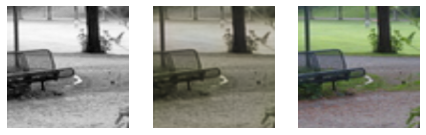

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 121, loss = 0.04275628179311752


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 122, loss = 0.052452486008405685


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 123, loss = 0.04616295173764229


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 124, loss = 0.051948431879282


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 125, loss = 0.04606837034225464


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 126, loss = 0.04538172483444214


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 127, loss = 0.04742431640625


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 128, loss = 0.04454892501235008


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 129, loss = 0.04317423701286316


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 130, loss = 0.052189067006111145


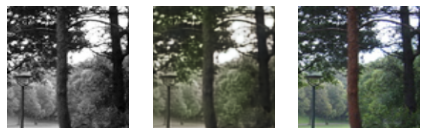

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 131, loss = 0.043282199651002884


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 132, loss = 0.04384433850646019


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 133, loss = 0.04250212013721466


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 134, loss = 0.046916503459215164


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 135, loss = 0.043654557317495346


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 136, loss = 0.04471272975206375


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 137, loss = 0.04526424780488014


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 138, loss = 0.04457853361964226


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 139, loss = 0.049274276942014694


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 140, loss = 0.04122963547706604


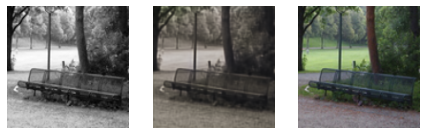

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 141, loss = 0.04295041039586067


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 142, loss = 0.046334173530340195


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 143, loss = 0.04583502933382988


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 144, loss = 0.04311190918087959


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 145, loss = 0.05200164020061493


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 146, loss = 0.04131593927741051


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 147, loss = 0.04801220819354057


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 148, loss = 0.042415160685777664


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 149, loss = 0.04967355728149414


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 150, loss = 0.048740286380052567


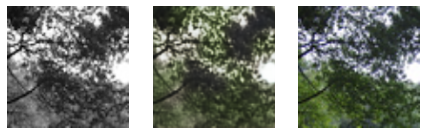

In [ ]:
model1, history = train(model1, criterion, optimizer, PATH, num_epochs=151)

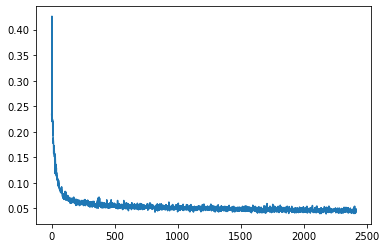

In [ ]:
plt.plot(history)
plt.show()

Теперь посмотрим на картиночки.

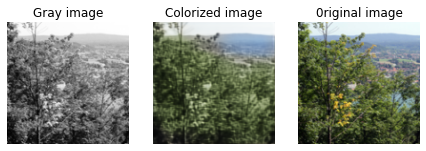

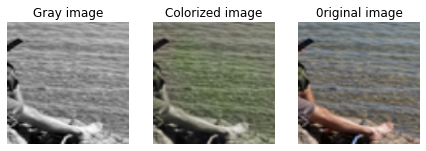

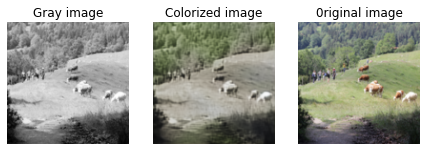

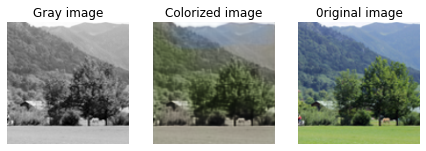

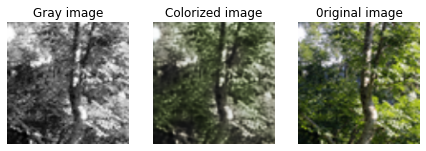

In [ ]:
draw_special(model1, [122, 133, 139, 187, 199])

Природа предсказана нормально, посмотрим на раскращенных людей.

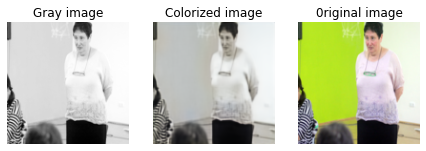

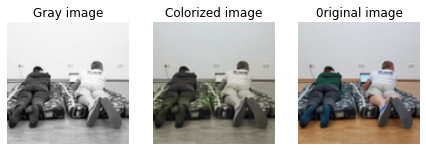

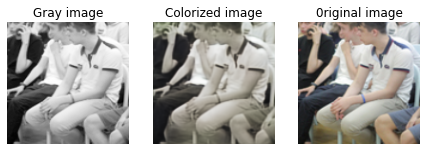

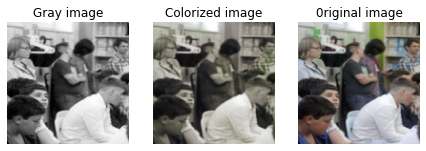

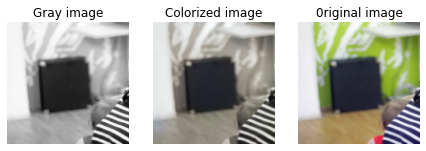

In [ ]:
draw_special(model1, range(5))

Такое себе зрелище! Итог: природа раскрашена нормально, люди не очень. Сохраним эту модельку.

In [ ]:
torch.save({
    'epochs_count': 150,
    'model_state_dict': model1.state_dict(),
}, PATH+"1prototype.pt")

In [17]:
checkpoint1 = torch.load(PATH+"1prototype.pt")
model1.load_state_dict(checkpoint1['model_state_dict'])

<All keys matched successfully>

Попробуем использовать другой лосс.

In [18]:
lr = 1e-3

model2 = Colorizer().to(device)
optimizer = torch.optim.Adam(model2.parameters(), lr=lr)
criterion = nn.MSELoss()

  0%|          | 0/151 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 0, loss = 0.05117536336183548 - best loss for now


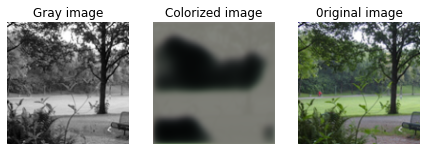

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 1, loss = 0.024709157645702362 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 2, loss = 0.017721334472298622 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 3, loss = 0.015304909087717533 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 4, loss = 0.01392494235187769 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 5, loss = 0.011022181250154972 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 6, loss = 0.011128860525786877


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 7, loss = 0.009385155513882637 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 8, loss = 0.010521627962589264


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 9, loss = 0.009794470854103565


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 10, loss = 0.008348340168595314 - best loss for now


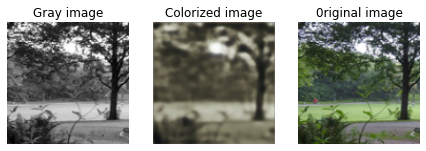

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 11, loss = 0.007572207134217024 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 12, loss = 0.009103024378418922


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 13, loss = 0.006783640012145042 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 14, loss = 0.008117311634123325


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 15, loss = 0.008557700552046299


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 16, loss = 0.009166168980300426


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 17, loss = 0.00883130170404911


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 18, loss = 0.007666213437914848


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 19, loss = 0.010537424124777317


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 20, loss = 0.006671410985291004 - best loss for now


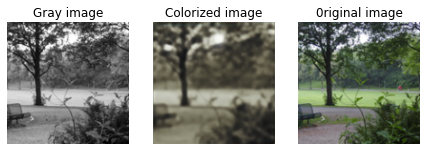

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 21, loss = 0.007505785208195448


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 22, loss = 0.0077351718209683895


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 23, loss = 0.006716394796967506


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 24, loss = 0.006076915189623833 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 25, loss = 0.006052967626601458 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 26, loss = 0.0073755537159740925


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 27, loss = 0.00811639055609703


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 28, loss = 0.0060216817073524 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 29, loss = 0.008403569459915161


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 30, loss = 0.006726142019033432


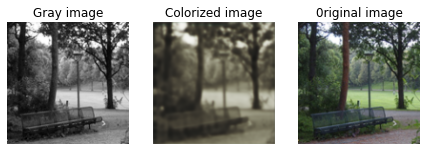

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 31, loss = 0.008008293807506561


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 32, loss = 0.007029289845377207


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 33, loss = 0.005869091022759676 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 34, loss = 0.007703942712396383


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 35, loss = 0.00817997194826603


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 36, loss = 0.007144101429730654


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 37, loss = 0.00636014761403203


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 38, loss = 0.007675049360841513


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 39, loss = 0.006349457893520594


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 40, loss = 0.005554969422519207 - best loss for now


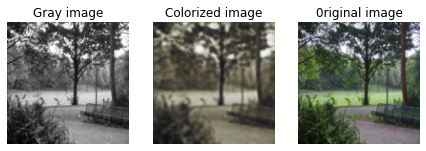

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 41, loss = 0.007465234491974115


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 42, loss = 0.006612708326429129


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 43, loss = 0.008157714270055294


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 44, loss = 0.005747983697801828


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 45, loss = 0.007961682975292206


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 46, loss = 0.0064388965256512165


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 47, loss = 0.0064577218145132065


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 48, loss = 0.008169964887201786


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 49, loss = 0.0074930195696651936


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 50, loss = 0.006025917362421751


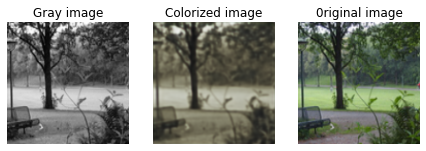

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 51, loss = 0.008335844613611698


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 52, loss = 0.0059827771037817


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 53, loss = 0.006036535836756229


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 54, loss = 0.006684207823127508


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 55, loss = 0.007400211412459612


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 56, loss = 0.004429894499480724 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 57, loss = 0.006371574476361275


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 58, loss = 0.007545482367277145


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 59, loss = 0.005058440379798412


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 60, loss = 0.005648971069604158


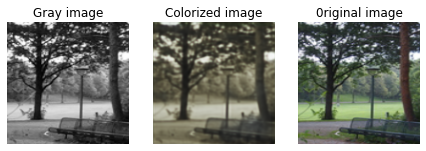

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 61, loss = 0.006683267652988434


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 62, loss = 0.005960071925073862


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 63, loss = 0.00578604731708765


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 64, loss = 0.008202513679862022


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 65, loss = 0.007362925913184881


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 66, loss = 0.0063140541315078735


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 67, loss = 0.006743342615664005


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 68, loss = 0.006945775821805


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 69, loss = 0.0074538313783705235


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 70, loss = 0.0070386831648647785


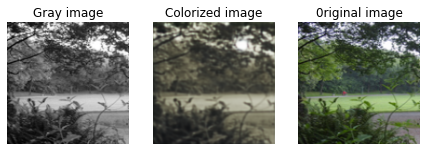

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 71, loss = 0.004986780695617199


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 72, loss = 0.00515546603128314


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 73, loss = 0.005652263294905424


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 74, loss = 0.0066228024661540985


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 75, loss = 0.006555674131959677


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 76, loss = 0.005670984275639057


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 77, loss = 0.004734813701361418


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 78, loss = 0.005871136207133532


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 79, loss = 0.006724786479026079


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 80, loss = 0.007106374949216843


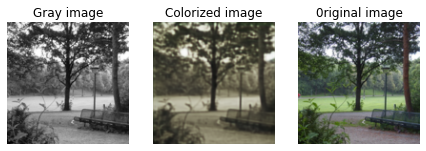

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 81, loss = 0.006798528600484133


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 82, loss = 0.006640806794166565


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 83, loss = 0.005463905166834593


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 84, loss = 0.005991717800498009


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 85, loss = 0.004563317634165287


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 86, loss = 0.0062135145999491215


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 87, loss = 0.005092823877930641


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 88, loss = 0.005977035965770483


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 89, loss = 0.005117032211273909


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 90, loss = 0.004784777294844389


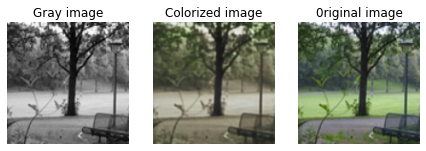

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 91, loss = 0.00612441124394536


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 92, loss = 0.0054796962067484856


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 93, loss = 0.006059922277927399


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 94, loss = 0.005257717799395323


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 95, loss = 0.006018118932843208


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 96, loss = 0.007509056478738785


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 97, loss = 0.005598300136625767


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 98, loss = 0.0059647816233336926


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 99, loss = 0.007818903774023056


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 100, loss = 0.0042877960950136185 - best loss for now


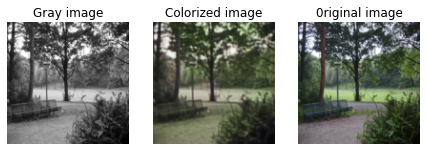

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 101, loss = 0.0055925981141626835


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 102, loss = 0.007906172424554825


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 103, loss = 0.0050158146768808365


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 104, loss = 0.0048560877330601215


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 105, loss = 0.0064080823212862015


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 106, loss = 0.007325935177505016


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 107, loss = 0.004166985861957073 - best loss for now


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 108, loss = 0.005210733972489834


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 109, loss = 0.006505120079964399


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 110, loss = 0.0061535462737083435


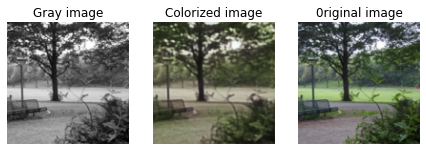

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 111, loss = 0.007266644854098558


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 112, loss = 0.004893556237220764


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 113, loss = 0.00550766009837389


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 114, loss = 0.004816765431314707


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 115, loss = 0.005396389402449131


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 116, loss = 0.00771285081282258


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 117, loss = 0.005143670365214348


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 118, loss = 0.005220575723797083


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 119, loss = 0.006506023928523064


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 120, loss = 0.0051069119945168495


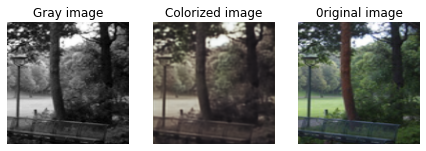

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 121, loss = 0.006451597902923822


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 122, loss = 0.004997591953724623


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 123, loss = 0.005303152836859226


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 124, loss = 0.004834618419408798


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 125, loss = 0.005668189376592636


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 126, loss = 0.005214525852352381


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 127, loss = 0.0046587600372731686


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 128, loss = 0.004963365849107504


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 129, loss = 0.004404046107083559


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 130, loss = 0.006269003264605999


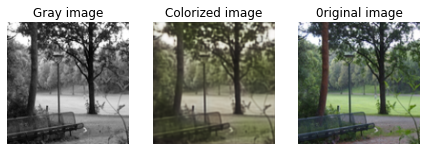

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 131, loss = 0.006938392296433449


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 132, loss = 0.004679977893829346


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 133, loss = 0.004578250460326672


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 134, loss = 0.004970146343111992


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 135, loss = 0.005025641992688179


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 136, loss = 0.006084882654249668


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 137, loss = 0.00582681642845273


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 138, loss = 0.005428710486739874


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 139, loss = 0.00827278196811676


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 140, loss = 0.00520472414791584


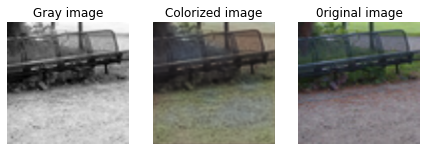

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 141, loss = 0.006208139471709728


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 142, loss = 0.006131321657449007


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 143, loss = 0.008503476157784462


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 144, loss = 0.0062132710590958595


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 145, loss = 0.004339763894677162


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 146, loss = 0.005770618095993996


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 147, loss = 0.005157815758138895


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 148, loss = 0.004864099435508251


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 149, loss = 0.005365737713873386


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch = 150, loss = 0.0074274661019444466


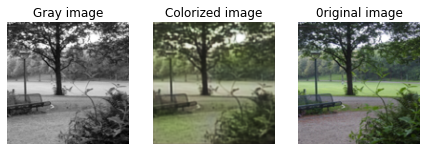

In [ ]:
model2, history2 = train(model2, criterion, optimizer, PATH, num_epochs=151)

Аналогично посмотрим на картиночки.

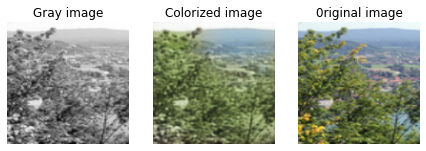

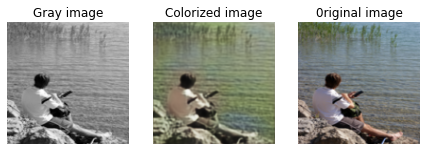

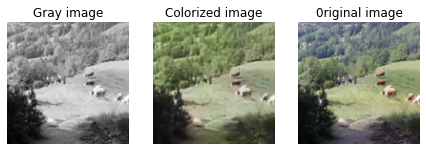

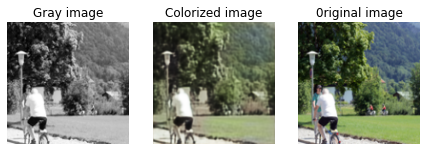

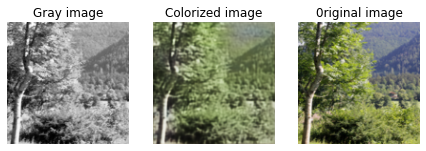

In [ ]:
draw_special(model2, [122, 133, 139, 187, 199])

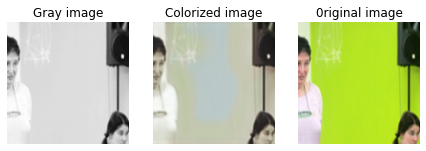

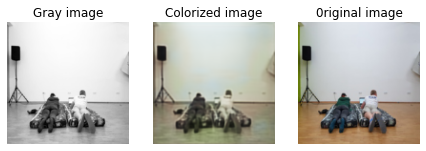

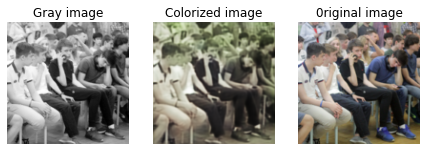

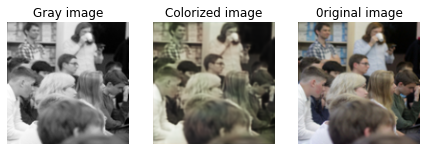

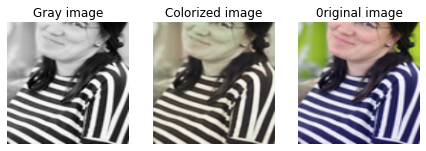

In [ ]:
draw_special(model2, range(5))

In [ ]:
torch.save({
    'epochs_count': 150,
    'model_state_dict': model2.state_dict(),
}, PATH+"2prototype.pt")

In [19]:
checkpoint2 = torch.load(PATH+"2prototype.pt")
model2.load_state_dict(checkpoint2['model_state_dict'])

<All keys matched successfully>

На самом деле, выглядит лучше, чем было при L1-лоссе.

Тут стоит отметить **важную** вещь: в датасете никак не используется аугументация, то есть само преобразование есть, но оно есть только уже к имеющейся картинке и новых картинок не добавляется. Можно попоробовать увеличить количество данных.

После сообщения **boss of the gym** в нашем чате: "your life your choice", со мной обдумывала что сделать половина маршрутки. Так вот, буду увеличивать число элементов в датасете в __init__(), а затем к ним будут применяться оставшиеся трансформации в __getitem__().

In [20]:
import os
from PIL import Image

class ColorizationDataset2(Dataset):
    def __init__(self, path, transform_x, transform_y, size=128):
        self.transform_x = transform_x
        self.transform_y = transform_y
      
        filenames = []
        for root, dirs, files in os.walk(path):
            for file in files:
                if file.endswith('.jpg') or file.endswith('.JPG'):
                    filenames.append(os.path.join(root, file))

        self.images = []
        for filename in tqdm(filenames):
            try:
                with Image.open(filename) as image:
                    # Помимо самой картинки будем добавлять 2 случайных квадрата 128 на 128 из картинки,
                    # которые в последствии будут обрабатываться аналогично.
                    # self.images.append(image.copy())
                    self.images.append(transforms.RandomResizedCrop(size)(image.copy()))
                    self.images.append(transforms.RandomResizedCrop(size)(image.copy()))
                    self.images.append(transforms.RandomResizedCrop(size)(image.copy()))
            except:
                pass
                # print('Could not load image:', filename)

    def __len__(self):
        return len(self.images)

    def get_images(self):
        return self.images

    def __getitem__(self, idx):
        img = self.images[idx]
        Y = self.transform_y(img)
        X = self.transform_x(Y)
        return X, Y

In [21]:
transform_all2 = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
])

In [22]:
# Так как идея увеличения датасета пришла позже, чем я обучил две модели, придется переобозначать имеющиеся переменные
dataset = ColorizationDataset2('universum-photos', to_grayscale, transform_all2)
loader = DataLoader(dataset, batch_size=64, shuffle=True)

  0%|          | 0/1254 [00:00<?, ?it/s]

In [23]:
len(dataset)

3045

Картинок стала в 3 раза больше.

MSE-Loss дал результат получше, восопльзуемся им. 

In [24]:
lr = 1e-3

model3 = Colorizer().to(device)
optimizer = torch.optim.Adam(model3.parameters(), lr=lr)
criterion = nn.MSELoss()

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 0, loss = 0.031133068725466728 - best loss for now


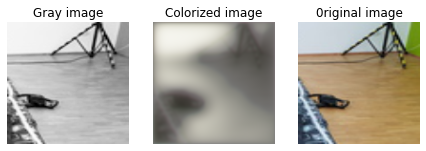

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 1, loss = 0.012610548175871372 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 2, loss = 0.010768916457891464 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 3, loss = 0.008722885511815548 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 4, loss = 0.009716080501675606


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 5, loss = 0.007541910279542208 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 6, loss = 0.006365133915096521 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 7, loss = 0.0054695941507816315 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 8, loss = 0.0076650832779705524


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 9, loss = 0.0049197073094546795 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 10, loss = 0.006270762532949448


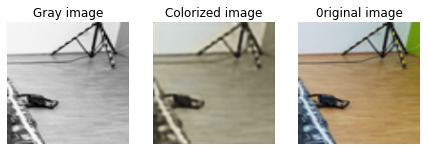

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 11, loss = 0.00886579230427742


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 12, loss = 0.00962529145181179


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 13, loss = 0.005928767845034599


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 14, loss = 0.0062230611220002174


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 15, loss = 0.006783956196159124


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 16, loss = 0.005519963800907135


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 17, loss = 0.005181018263101578


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 18, loss = 0.006609407253563404


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 19, loss = 0.006346310954540968


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 20, loss = 0.005713844206184149


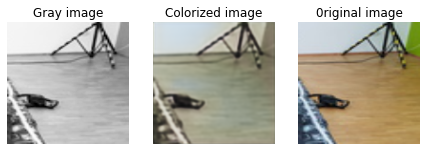

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 21, loss = 0.0054742745123803616


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 22, loss = 0.005057415459305048


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 23, loss = 0.005264027509838343


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 24, loss = 0.00573199987411499


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 25, loss = 0.00838023703545332


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 26, loss = 0.007195868995040655


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 27, loss = 0.005512974224984646


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 28, loss = 0.0049860295839607716


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 29, loss = 0.007343346253037453


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 30, loss = 0.0056392354890704155


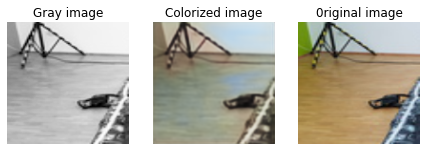

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 31, loss = 0.005273360293358564


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 32, loss = 0.004376336932182312 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 33, loss = 0.0062047578394412994


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 34, loss = 0.0076662697829306126


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 35, loss = 0.006282240618020296


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 36, loss = 0.005006225313991308


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 37, loss = 0.007647506892681122


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 38, loss = 0.006630151066929102


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 39, loss = 0.0052109891548752785


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 40, loss = 0.005528561305254698


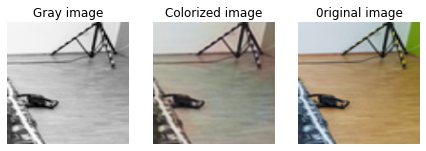

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 41, loss = 0.004933027550578117


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 42, loss = 0.004788026213645935


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 43, loss = 0.00394862936809659 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 44, loss = 0.0055067939683794975


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 45, loss = 0.0038462625816464424 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 46, loss = 0.00495676975697279


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 47, loss = 0.005823650397360325


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 48, loss = 0.004772726446390152


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 49, loss = 0.005219967570155859


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 50, loss = 0.005229752976447344


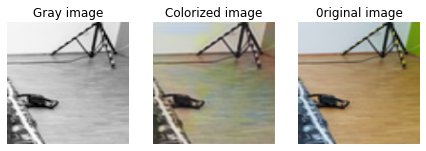

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 51, loss = 0.004427309613674879


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 52, loss = 0.00535175995901227


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 53, loss = 0.005766324233263731


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 54, loss = 0.006089415401220322


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 55, loss = 0.004408278968185186


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 56, loss = 0.004869859665632248


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 57, loss = 0.004496789071708918


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 58, loss = 0.005513068288564682


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 59, loss = 0.005415977910161018


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 60, loss = 0.003931892570108175


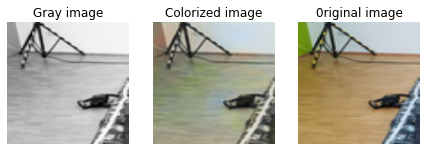

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 61, loss = 0.0036450615152716637 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 62, loss = 0.004357550293207169


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 63, loss = 0.006061842665076256


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 64, loss = 0.0038395363371819258


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 65, loss = 0.004347547888755798


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 66, loss = 0.0034681621473282576 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 67, loss = 0.002855542814359069 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 68, loss = 0.003564966144040227


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 69, loss = 0.0038301078602671623


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 70, loss = 0.0041825855150818825


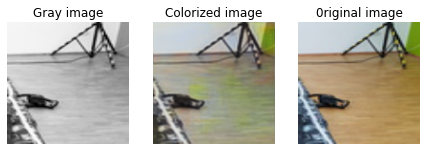

In [ ]:
model3, history2 = train(model3, criterion, optimizer, PATH, num_epochs=71)

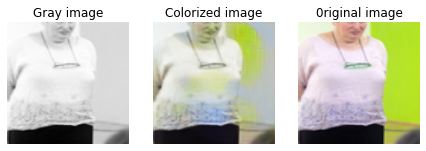

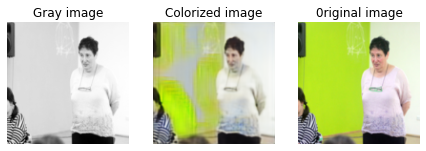

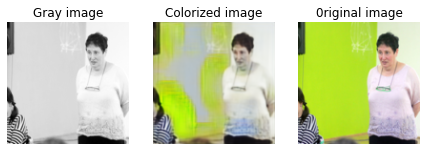

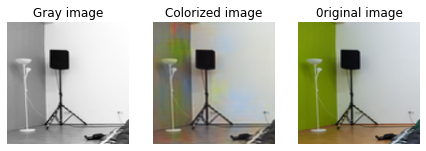

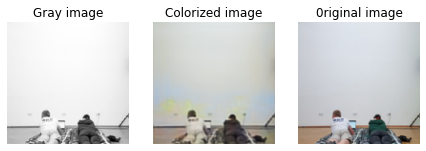

In [ ]:
draw(model3, 0, 5)

Видим, что покраска нормальная началась. Продолжим обучать моедльку.

Epoch = 0, loss = 0.031133068725466728, best_loss = 0.002855542814359069
Epoch = 1, loss = 0.012610548175871372, best_loss = 0.002855542814359069
Epoch = 2, loss = 0.010768916457891464, best_loss = 0.002855542814359069
Epoch = 3, loss = 0.008722885511815548, best_loss = 0.002855542814359069
Epoch = 4, loss = 0.009716080501675606, best_loss = 0.002855542814359069
Epoch = 5, loss = 0.007541910279542208, best_loss = 0.002855542814359069
Epoch = 6, loss = 0.006365133915096521, best_loss = 0.002855542814359069
Epoch = 7, loss = 0.0054695941507816315, best_loss = 0.002855542814359069
Epoch = 8, loss = 0.0076650832779705524, best_loss = 0.002855542814359069
Epoch = 9, loss = 0.0049197073094546795, best_loss = 0.002855542814359069
Epoch = 10, loss = 0.006270762532949448, best_loss = 0.002855542814359069
Epoch = 11, loss = 0.00886579230427742, best_loss = 0.002855542814359069
Epoch = 12, loss = 0.00962529145181179, best_loss = 0.002855542814359069
Epoch = 13, loss = 0.005928767845034599, best_l

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 71, loss = 0.004049514885991812


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 72, loss = 0.004975531715899706


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 73, loss = 0.004808082245290279


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 74, loss = 0.004217604175209999


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 75, loss = 0.004661311861127615


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 76, loss = 0.005258491262793541


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 77, loss = 0.004814544692635536


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 78, loss = 0.003655046224594116


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 79, loss = 0.004876964259892702


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 80, loss = 0.0033738124184310436


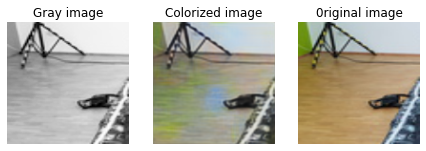

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 81, loss = 0.00292410422116518


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 82, loss = 0.0034833073150366545


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 83, loss = 0.003227024106308818


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 84, loss = 0.0031993063166737556


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 85, loss = 0.002796782646328211 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 86, loss = 0.003134279977530241


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 87, loss = 0.0029370319098234177


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 88, loss = 0.0035607770550996065


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 89, loss = 0.0031580589711666107


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 90, loss = 0.002648834139108658 - best loss for now


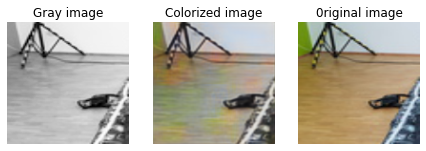

  0%|          | 0/48 [00:00<?, ?it/s]

In [ ]:
model3, history3 = train(model3, criterion, optimizer, PATH, num_epochs=101)

На 90й эпохе у меня закончилось время обучения на одном аккаунте, но кто сказал, что аккаунт у меня один...

Epoch = 0, loss = 0.031133068725466728, best_loss = 0.002648834139108658
Epoch = 1, loss = 0.012610548175871372, best_loss = 0.002648834139108658
Epoch = 2, loss = 0.010768916457891464, best_loss = 0.002648834139108658
Epoch = 3, loss = 0.008722885511815548, best_loss = 0.002648834139108658
Epoch = 4, loss = 0.009716080501675606, best_loss = 0.002648834139108658
Epoch = 5, loss = 0.007541910279542208, best_loss = 0.002648834139108658
Epoch = 6, loss = 0.006365133915096521, best_loss = 0.002648834139108658
Epoch = 7, loss = 0.0054695941507816315, best_loss = 0.002648834139108658
Epoch = 8, loss = 0.0076650832779705524, best_loss = 0.002648834139108658
Epoch = 9, loss = 0.0049197073094546795, best_loss = 0.002648834139108658
Epoch = 10, loss = 0.006270762532949448, best_loss = 0.002648834139108658
Epoch = 11, loss = 0.00886579230427742, best_loss = 0.002648834139108658
Epoch = 12, loss = 0.00962529145181179, best_loss = 0.002648834139108658
Epoch = 13, loss = 0.005928767845034599, best_l

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 91, loss = 0.003735325997695327


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 92, loss = 0.003653179854154587


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 93, loss = 0.004609259311109781


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 94, loss = 0.004204250406473875


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 95, loss = 0.003755395533517003


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 96, loss = 0.003935914020985365


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 97, loss = 0.004064795561134815


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 98, loss = 0.003198374528437853


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 99, loss = 0.0036374011542648077


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 100, loss = 0.0035236049443483353


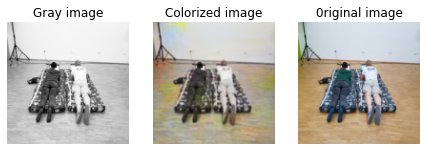

In [25]:
model3, history3 = train(model3, criterion, optimizer, PATH, num_epochs=101)

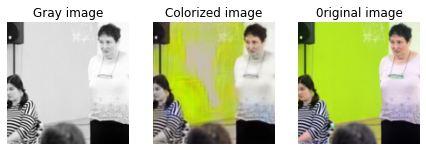

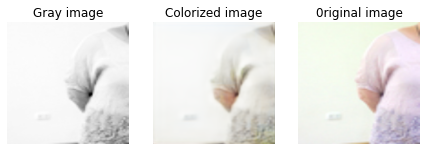

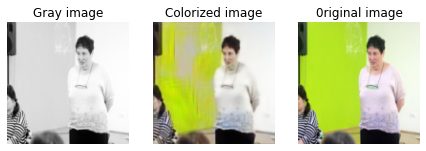

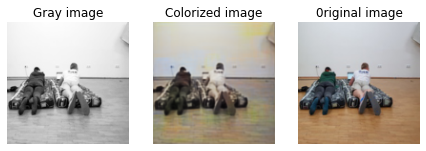

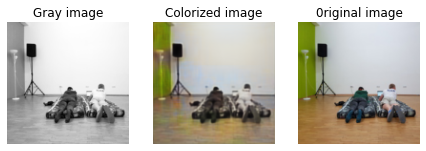

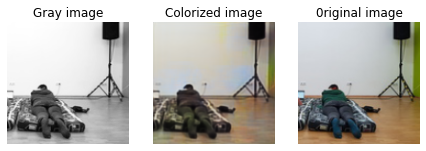

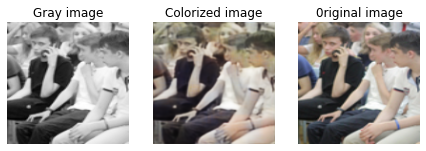

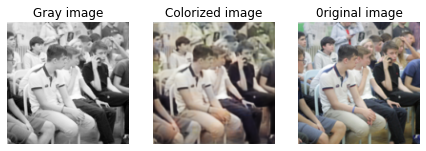

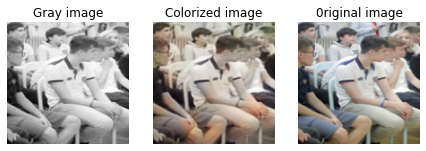

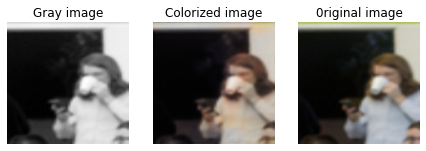

In [27]:
draw(model3, 0, 10)

Результат намного лучше! Что же делать дальше? Правильно: пообучать модель ещё!

Epoch = 0, loss = 0.031133068725466728, best_loss = 0.002648834139108658
Epoch = 1, loss = 0.012610548175871372, best_loss = 0.002648834139108658
Epoch = 2, loss = 0.010768916457891464, best_loss = 0.002648834139108658
Epoch = 3, loss = 0.008722885511815548, best_loss = 0.002648834139108658
Epoch = 4, loss = 0.009716080501675606, best_loss = 0.002648834139108658
Epoch = 5, loss = 0.007541910279542208, best_loss = 0.002648834139108658
Epoch = 6, loss = 0.006365133915096521, best_loss = 0.002648834139108658
Epoch = 7, loss = 0.0054695941507816315, best_loss = 0.002648834139108658
Epoch = 8, loss = 0.0076650832779705524, best_loss = 0.002648834139108658
Epoch = 9, loss = 0.0049197073094546795, best_loss = 0.002648834139108658
Epoch = 10, loss = 0.006270762532949448, best_loss = 0.002648834139108658
Epoch = 11, loss = 0.00886579230427742, best_loss = 0.002648834139108658
Epoch = 12, loss = 0.00962529145181179, best_loss = 0.002648834139108658
Epoch = 13, loss = 0.005928767845034599, best_l

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 101, loss = 0.0038061451632529497


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 102, loss = 0.0034641772508621216


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 103, loss = 0.00306419818662107


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 104, loss = 0.002577953739091754 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 105, loss = 0.0030631020199507475


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 106, loss = 0.0026458201464265585


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 107, loss = 0.0028360593132674694


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 108, loss = 0.0026821333449333906


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 109, loss = 0.003029314335435629


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 110, loss = 0.0024548822548240423 - best loss for now


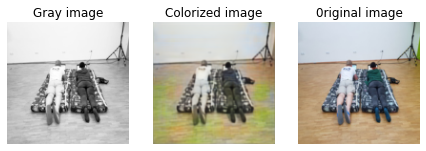

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 111, loss = 0.002530343597754836


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 112, loss = 0.0026271422393620014


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 113, loss = 0.0026420194189995527


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 114, loss = 0.002431613625958562 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 115, loss = 0.0031167776323854923


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 116, loss = 0.002416871953755617 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 117, loss = 0.002195995068177581 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 118, loss = 0.002202340867370367


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 119, loss = 0.0025570166762918234


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 120, loss = 0.0022023413330316544


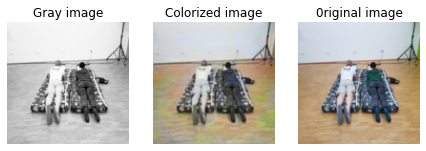

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 121, loss = 0.002019251463934779 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 122, loss = 0.002071203663945198


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 123, loss = 0.0020233250688761473


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 124, loss = 0.0023464763071388006


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 125, loss = 0.0024015482049435377


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 126, loss = 0.0024527637287974358


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 127, loss = 0.0018621118506416678 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 128, loss = 0.0016428965609520674 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 129, loss = 0.0019040966872125864


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 130, loss = 0.0017823693342506886


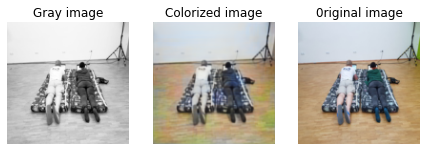

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 131, loss = 0.0015830830670893192 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 132, loss = 0.0018468599300831556


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 133, loss = 0.002152813831344247


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 134, loss = 0.0016817323630675673


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 135, loss = 0.0015119825256988406 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 136, loss = 0.0018128930823877454


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 137, loss = 0.0017099485266953707


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 138, loss = 0.0014532128116115928 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 139, loss = 0.0016334193060174584


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 140, loss = 0.00143543747253716 - best loss for now


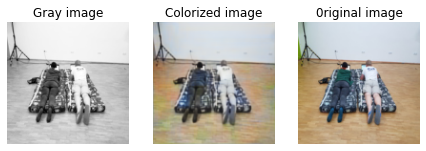

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 141, loss = 0.0013672950444743037 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 142, loss = 0.0015413735527545214


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 143, loss = 0.0016061159549281001


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 144, loss = 0.0012122427579015493 - best loss for now


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 145, loss = 0.0013282585423439741


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 146, loss = 0.0014814793830737472


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 147, loss = 0.0013680380070582032


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 148, loss = 0.001270950771868229


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 149, loss = 0.0013390989042818546


  0%|          | 0/48 [00:00<?, ?it/s]

Epoch = 150, loss = 0.0013420273317024112


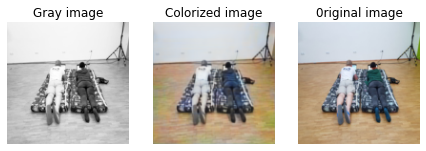

In [28]:
model3, history3 = train(model3, criterion, optimizer, PATH, num_epochs=151)

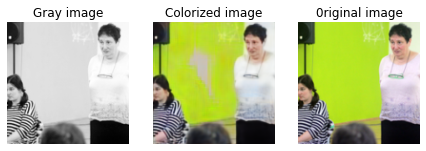

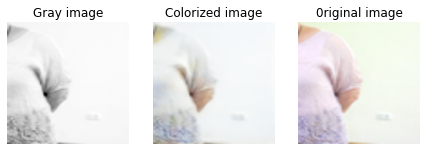

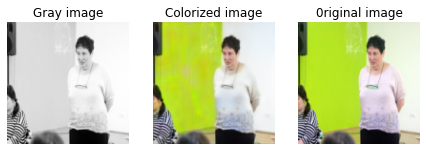

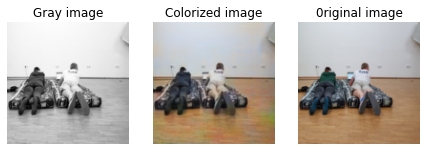

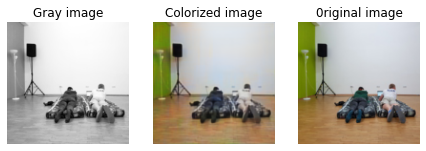

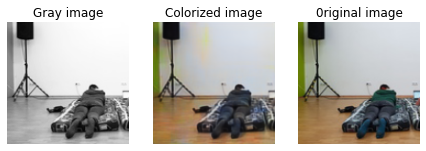

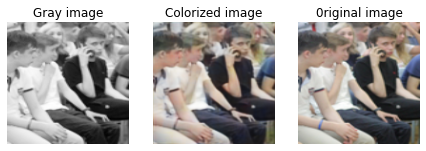

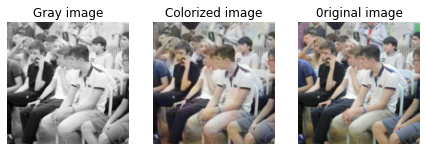

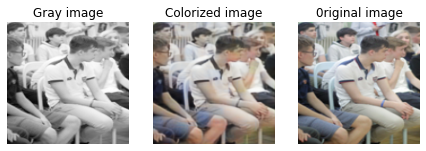

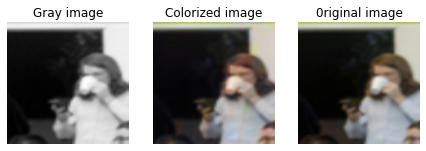

In [29]:
draw(model3, 0, 10)

Ну что же, я считаю это триумфом воли, ведь я занимался это домашкой 4 дня (4, Марк), хотя домашка обещала быть приключением на 20 мин.

In [42]:
torch.save({
    'epochs_count': 150,
    'model_state_dict': model3.state_dict(),
}, PATH+"3prototype.pt")